In [1]:
from micromind import Metric
from micromind.utils.parse import parse_arguments

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms

import os
import random
import importlib
import numpy as np

from tqdm import tqdm

import matplotlib.pyplot as plt


batch_size = 64

In [85]:
from micromind import MicroMind
from micromind.networks import PhiNet

import torch
import torch.nn as nn

model_path = "../pretrained/finetuned/baseline.ckpt"

if torch.cuda.is_available():
    device = torch.device("cuda:0")
    print("Running on the GPU")
elif torch.backends.mps.is_available: 
    device = torch.device("mps")
    print("Running on the MPS")
else:
    device = torch.device("cpu")
    print("Running on the CPU")

class ImageClassification(MicroMind):

    # test 1 with n as input vector size and m classes custom d
    # n has to be calculated from the output of the neural network of the feature extractor
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.input = 344
        self.output = 100

        self.modules["feature_extractor"] = PhiNet(
            input_shape=(3, 224, 224),
            alpha=0.9,
            num_layers=7,
            beta=0.5,
            t_zero=4.0,
            include_top=False,
            num_classes=1000,
            compatibility=False,
            divisor=8,
            downsampling_layers=[4,5,7]
        )

        # Taking away the classifier from pretrained model
        pretrained_dict = torch.load(model_path, map_location=device)
        model_dict = {}
        for k, v in pretrained_dict.items():
            if "classifier" not in k:
                model_dict[k] = v

        #loading the new model
        self.modules["feature_extractor"].load_state_dict(pretrained_dict["feature_extractor"])        
        for _, param in self.modules["feature_extractor"].named_parameters():    
            param.requires_grad = False

        self.modules["classifier"] = nn.Sequential(                
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten()            
        )    

    def forward(self, batch):        
        x = self.modules["feature_extractor"](batch)    
        x = self.modules["classifier"](x)    
        return x

    def compute_loss(self, pred, batch):
        return nn.CrossEntropyLoss()(pred, batch[1])                   
        

Running on the MPS


In [3]:
train_transform = transforms.Compose(
        [
         transforms.ToTensor(), 
         transforms.Normalize((0.5070751592371323, 0.48654887331495095, 0.4409178433670343), (0.26733428587941854, 0.25643846292120615, 0.2761504713263903)), 
         transforms.Resize((160, 160), antialias=True), 
         transforms.RandomHorizontalFlip(0.5),
         transforms.RandomRotation(10)
        ] 
    )

trainset = torchvision.datasets.CIFAR100(
    root="../data/cifar-100", train=True, download=True, transform=train_transform
)

train_loader = torch.utils.data.DataLoader(
    trainset, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=2,    
)

Files already downloaded and verified


In [87]:
model = ImageClassification()

FileNotFoundError: [Errno 2] No such file or directory: '../pretrained/finetuned/baseline.ckpt'

In [5]:
# creating tensors 
x = torch.tensor([]) 
y = torch.tensor([]) 
  
# printing above created tensors 
print("Tensor x:", x) 
print("Tensor y:", y) 
  
# join above tensor using "torch.stack()" 
print("join tensors:") 
t = torch.stack((x,y)) 
print(t)

Tensor x: tensor([])
Tensor y: tensor([])
join tensors:
tensor([], size=(2, 0))


In [6]:
it = iter(train_loader)

batch = next(it).to('mps')

x = model(batch[0])
y = batch[1].to('mps')

for j in range(500):    
    batch = next(it)

    output = model(batch[0])
    labels = batch[1]    

    x = torch.cat((x, output))
    y = torch.cat((y, labels))    


In [2]:
import pickle

# with open('embeddings_.pkl', 'wb') as file:
#     pickle.dump({"outputs":x, "labels":y}, file)    

In [8]:
with open('embeddings.pkl', 'rb') as file:
    data = pickle.load(file)

x = data["outputs"]
y = data["labels"]

In [9]:
print(x.shape)
print(y.shape)

torch.Size([32064, 344])
torch.Size([32064])


In [10]:
embeddings = np.array(x)

In [11]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def kmeans_cosine(data, k, max_iter=100):
    # Normalize data
    data_normalized = data / np.linalg.norm(data, axis=1, keepdims=True)
    
    # Initialize centroids
    centroids = data_normalized[np.random.choice(data.shape[0], k, replace=False)]
    
    for _ in range(max_iter):
        # Compute cosine similarity and assign clusters
        similarity = cosine_similarity(data_normalized, centroids)
        clusters = np.argmax(similarity, axis=1)
        
        # Update centroids
        new_centroids = np.array([data_normalized[clusters == i].mean(axis=0) for i in range(k)])
        
        # Normalize new centroids
        new_centroids = new_centroids / np.linalg.norm(new_centroids, axis=1, keepdims=True)
        
        # Check for convergence
        if np.allclose(centroids, new_centroids):
            break
        centroids = new_centroids

    return clusters, centroids

clusters, centroids = kmeans_cosine(embeddings, 10, max_iter=20)

print(clusters.shape)
print(centroids.shape)

(32064,)
(10, 344)


In [6]:
from sklearn.manifold import TSNE

projections = TSNE(n_components = 3).fit_transform(embeddings)

print(projections.shape)

(32064, 3)


In [12]:
# 

# interactive 3d chart

import plotly.express as px

fig = px.scatter_3d(projections, x=0, y=1, z=2, color=clusters)

fig.show()


# Some checks

(array([323., 339., 326., 317., 326., 321., 329., 334., 315., 324., 314.,
        319., 316., 327., 312., 315., 325., 331., 325., 314., 321., 327.,
        339., 321., 328., 330., 302., 317., 329., 318., 312., 300., 306.,
        344., 323., 321., 330., 318., 313., 338., 321., 317., 330., 312.,
        325., 308., 305., 296., 313., 318., 311., 314., 334., 320., 315.,
        337., 307., 326., 326., 338., 315., 325., 322., 314., 310., 317.,
        340., 307., 316., 320., 331., 309., 313., 312., 333., 338., 323.,
        297., 322., 303., 330., 314., 322., 314., 330., 317., 334., 316.,
        330., 309., 320., 328., 324., 317., 334., 317., 328., 298., 320.,
        333.]),
 array([ 0.  ,  0.99,  1.98,  2.97,  3.96,  4.95,  5.94,  6.93,  7.92,
         8.91,  9.9 , 10.89, 11.88, 12.87, 13.86, 14.85, 15.84, 16.83,
        17.82, 18.81, 19.8 , 20.79, 21.78, 22.77, 23.76, 24.75, 25.74,
        26.73, 27.72, 28.71, 29.7 , 30.69, 31.68, 32.67, 33.66, 34.65,
        35.64, 36.63, 37.62, 38.61

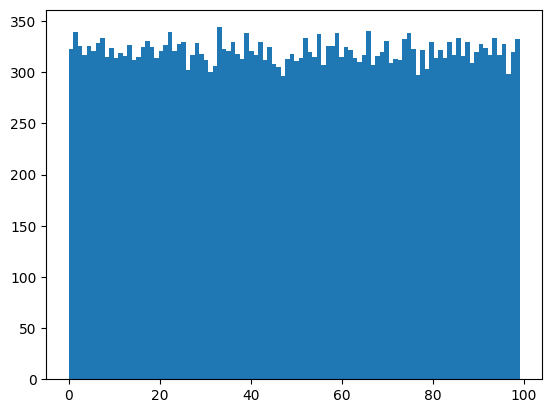

In [10]:
plt.hist(y, bins=100)

In [10]:
len(torch.unique(y))

100

In [11]:
torch.unique(y)

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
        54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
        72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
        90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

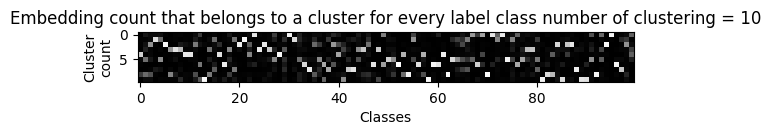

In [7]:
#fpr every label in 1 to 100 we want to see how many go to 

# matrix 10 x 100 -> for every row we see where how many labels from x target go to that cluster

a = np.zeros((centroids.shape[0],100))

#print(a)

for i, cluster in enumerate(clusters):
    a[cluster][y[i]] += 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Embedding count that belongs to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(a,cmap='Greys_r')



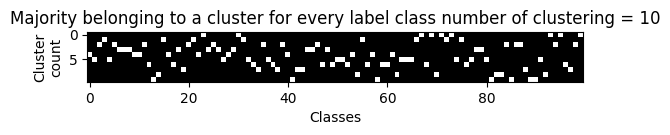

In [8]:
## majority voting for each class
b = np.argmax(a, axis=0)

c = np.zeros((centroids.shape[0],100))
for x in range(100):    
    c[b[x]][x] = 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Majority belonging to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(c, cmap='Greys_r')

In [9]:
# use the second matrix as a mask 

false_negative = np.ma.array(a,mask=c)

In [10]:
sum_fn = np.sum(false_negative)

print(sum_fn)

10224.0


In [11]:
sum_fn / np.sum(a)

0.3188622754491018

In [16]:
# map each line to cluster: label to cluster belonging

maps = {}

for i, x in enumerate(c):
    for j, y in enumerate(x):
        if(y==1):
            maps[j] = i
    
print(maps)

{8: 0, 13: 0, 41: 0, 48: 0, 58: 0, 81: 0, 85: 0, 89: 0, 90: 0, 3: 1, 15: 1, 19: 1, 21: 1, 31: 1, 34: 1, 38: 1, 42: 1, 43: 1, 65: 1, 66: 1, 80: 1, 88: 1, 97: 1, 12: 2, 23: 2, 49: 2, 60: 2, 68: 2, 69: 2, 71: 2, 76: 2, 5: 3, 20: 3, 25: 3, 39: 3, 84: 3, 86: 3, 87: 3, 94: 3, 0: 4, 9: 4, 10: 4, 16: 4, 22: 4, 28: 4, 40: 4, 53: 4, 57: 4, 61: 4, 99: 4, 30: 5, 55: 5, 67: 5, 72: 5, 73: 5, 91: 5, 93: 5, 95: 5, 2: 6, 11: 6, 32: 6, 35: 6, 46: 6, 98: 6, 17: 7, 33: 7, 37: 7, 47: 7, 52: 7, 56: 7, 59: 7, 96: 7, 4: 8, 18: 8, 26: 8, 27: 8, 29: 8, 36: 8, 44: 8, 50: 8, 51: 8, 63: 8, 64: 8, 74: 8, 75: 8, 77: 8, 78: 8, 1: 9, 6: 9, 7: 9, 14: 9, 24: 9, 45: 9, 54: 9, 62: 9, 70: 9, 79: 9, 82: 9, 83: 9, 92: 9}


In [28]:
np.sum(c, axis=1)

array([ 8.,  7.,  9.,  7., 19.,  8.,  6., 18.,  6., 12.])

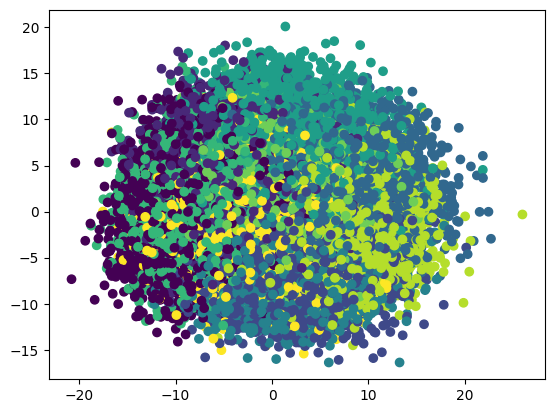

In [12]:
## I want to do PCA on the embeddings and see if I can see some clusters

from sklearn.decomposition import PCA

pca = PCA(n_components=2)

pca.fit(embeddings)

pca_embeddings = pca.transform(embeddings)

plt.scatter(pca_embeddings[:,0], pca_embeddings[:,1], c=clusters, cmap='viridis')

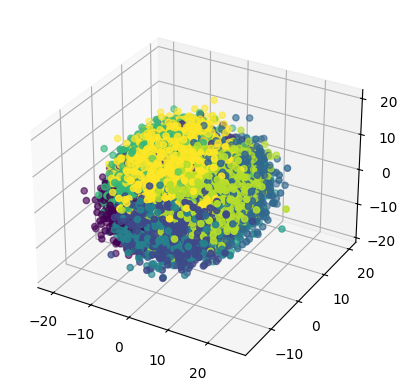

In [13]:
## I want to do PCA on the embeddings and see if I can see some clusters in 3 dimensions

from sklearn.decomposition import PCA

pca = PCA(n_components=3)

pca.fit(embeddings)

pca_embeddings = pca.transform(embeddings)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_embeddings[:,0], pca_embeddings[:,1], pca_embeddings[:,2], c=clusters, cmap='viridis')


In [30]:
!pip install ipykernel


In [14]:
# interactive 3d chart

import plotly.express as px

fig = px.scatter_3d(pca_embeddings, x=0, y=1, z=2, color=clusters)

fig.show()


In [17]:
## can I multiply all the vectors by 10 after PCA

pca_embeddings_10 = pca_embeddings * 100

fig = px.scatter_3d(pca_embeddings_10, x=0, y=1, z=2, color=clusters)

fig.show()


In [42]:
# what if we do PCA on the embeddings to 10 components

from sklearn.decomposition import PCA

pca = PCA(n_components=300)

pca.fit(embeddings)

pca_embeddings = pca.transform(embeddings)

pca_embeddings.shape

#then we apply clustering on this new embeddings

clusters, centroids = kmeans_cosine(pca_embeddings, 10, max_iter=100)

clusters.shape



(32064,)

In [43]:
np.sum(pca.explained_variance_ratio_)

0.9999871

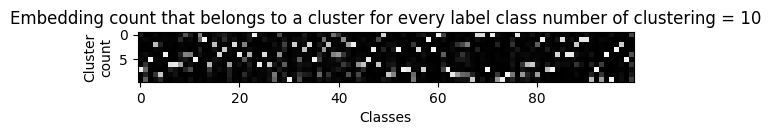

In [44]:
#fpr every label in 1 to 100 we want to see how many go to 

# matrix 10 x 100 -> for every row we see where how many labels from x target go to that cluster

a = np.zeros((centroids.shape[0],100))

#print(a)

for i, cluster in enumerate(clusters):
    a[cluster][y[i]] += 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Embedding count that belongs to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(a,cmap='Greys_r')


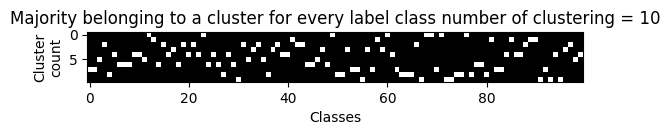

In [45]:
## majority voting for each class
b = np.argmax(a, axis=0)

c = np.zeros((centroids.shape[0],100))
for x in range(100):    
    c[b[x]][x] = 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Majority belonging to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(c, cmap='Greys_r')

In [46]:
# use the second matrix as a mask 

false_negative = np.ma.array(a,mask=c)
sum_fn = np.sum(false_negative)
print(sum_fn)
sum_fn / np.sum(a)

9155.0


0.28552270459081835

In [56]:
print(clusters.shape)

(32064,)


In [60]:
# Now we want to see which part of the embeddings are the most important for the clustering

features_mock = np.zeros((10,300))

for i, cluster in enumerate(clusters):
    features_mock[cluster] += pca_embeddings[i]

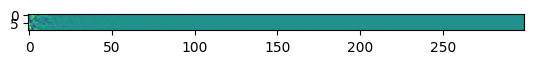

In [61]:
plt.imshow(features_mock)

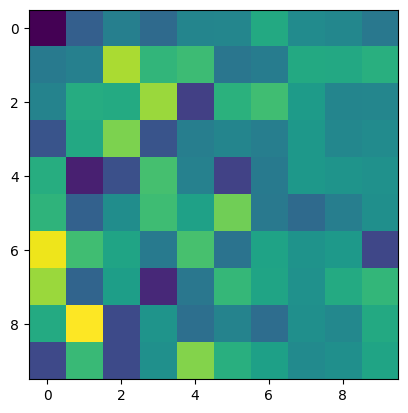

In [94]:
plt.imshow(features_mock[:,0:10])

In [80]:
## Given the 40 most important components we want to create a new clustering based on this
## This should be the centroids of the new clustering

pca_embeddings_40 = pca_embeddings[:,0:50]

clusters, centroids = kmeans_cosine(pca_embeddings_40, 10, max_iter=100)

clusters.shape

#fpr every label in 1 to 100 we want to see how many go to 


(32064,)

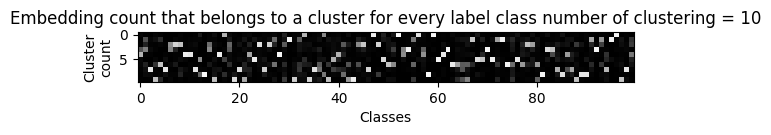

In [81]:
## Count how many labels are correctly assigned to the new clusters

a = np.zeros((centroids.shape[0],100))

#print(a)

for i, cluster in enumerate(clusters):
    a[cluster][y[i]] += 1
    
plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")

plt.title("Embedding count that belongs to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(a,cmap='Greys_r')



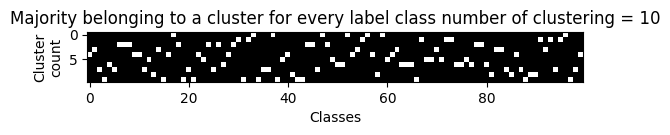

In [82]:
## majority voting for each class
b = np.argmax(a, axis=0)

c = np.zeros((centroids.shape[0],100))
for x in range(100):    
    c[b[x]][x] = 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Majority belonging to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(c, cmap='Greys_r')

In [83]:
# use the second matrix as a mask 

false_negative = np.ma.array(a,mask=c)
sum_fn = np.sum(false_negative)
print(sum_fn)
sum_fn / np.sum(a)

9687.0


0.30211452095808383

In [89]:
half_embeddings = embeddings[:,0:150]

clusters, centroids = kmeans_cosine(half_embeddings, 10, max_iter=100)

clusters.shape


(32064,)

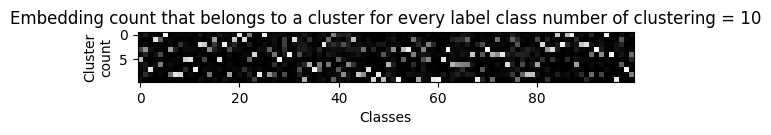

In [90]:
#fpr every label in 1 to 100 we want to see how many go to 

# matrix 10 x 100 -> for every row we see where how many labels from x target go to that cluster

a = np.zeros((centroids.shape[0],100))

#print(a)

for i, cluster in enumerate(clusters):
    a[cluster][y[i]] += 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Embedding count that belongs to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(a,cmap='Greys_r')

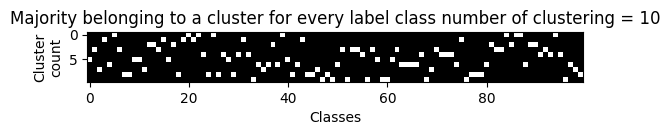

In [91]:
## majority voting for each class
b = np.argmax(a, axis=0)

c = np.zeros((centroids.shape[0],100))
for x in range(100):    
    c[b[x]][x] = 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Majority belonging to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(c, cmap='Greys_r')

In [92]:
# use the second matrix as a mask 

false_negative = np.ma.array(a,mask=c)
sum_fn = np.sum(false_negative)
print(sum_fn)
sum_fn / np.sum(a)

11483.0


0.35812749500998003